**Подключение библиотек и скриптов**

In [225]:
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.image as img
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [226]:
matplotlib.rcParams.update({'font.size': 14})  # размер шрифта на графиках

**Пути к директориям и файлам**

In [227]:
DATASET_PATH = 'housing.csv'
PREPARED_DATASET_PATH = 'housing_prepared.csv'
CALIFORNIA_MAP_PATH = 'California_Map.png'
DATASET_NEW = 'housing_new.csv'

**Загрузка данных**

In [228]:
dsh = pd.read_csv(PREPARED_DATASET_PATH, sep=',')
dsh.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,bedroom_share,men_per_household,population_per_room,age_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,14.659091,2.555556,0.365909,4
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,15.579659,2.109842,0.338217,3
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,12.951602,2.802260,0.338105,4
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0,18.445840,2.547945,0.437991,4
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0,17.209588,2.181467,0.347265,4


**Уменьшение объема памяти, который занимает датасет**

In [229]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [230]:
dsh = reduce_mem_usage(dsh)

Memory usage of dataframe is 2.83 MB
Memory usage after optimization is: 1.06 MB
Decreased by 62.5%


In [231]:
dsh.dtypes

longitude              float32
latitude               float32
housing_median_age     float32
total_rooms            float32
total_bedrooms         float32
population             float32
households             float32
median_income          float32
median_house_value     float32
<1H OCEAN                 int8
INLAND                    int8
ISLAND                    int8
NEAR BAY                  int8
NEAR OCEAN                int8
bedroom_share          float32
men_per_household      float32
population_per_room    float32
age_cat                   int8
dtype: object

## **Распределение целевой переменной**

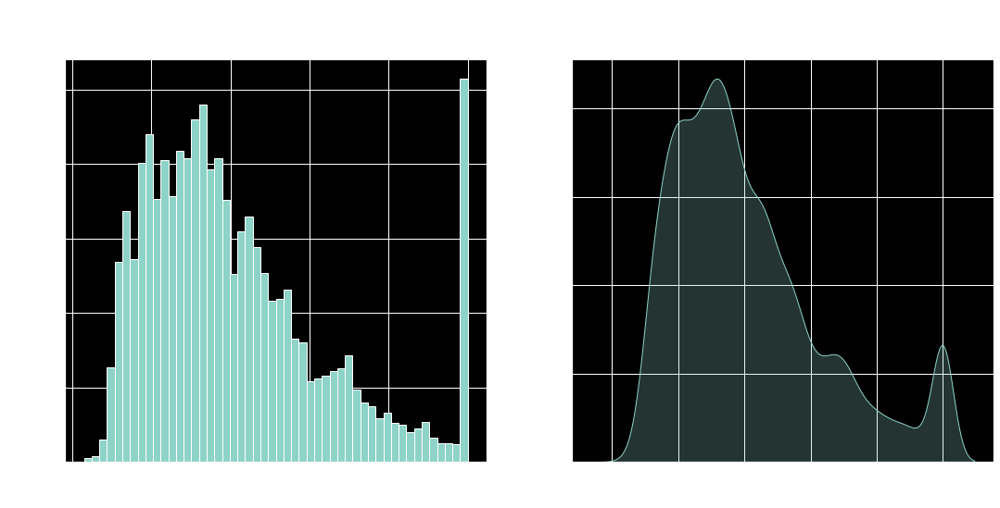

In [232]:
plt.figure(figsize = (16, 8))
plt.style.use('dark_background')

plt.subplot(121)
dsh['median_house_value'].hist(density = False, bins = 50)
plt.ylabel('count')
plt.xlabel('median_house_value')

plt.subplot(122)
sns.kdeplot(dsh['median_house_value'], shade = True, legend = False)
plt.xlabel('median_house_value')

plt.suptitle('Распределение median_house_value')
plt.show()

Виден какой-то выброс средней цены дома в диапазоне около 500000.

In [233]:
dsh['median_house_value'].value_counts()

500001.0    965
137500.0    121
162500.0    117
112500.0    103
187500.0     93
           ... 
359200.0      1
54900.0       1
377600.0      1
81200.0       1
47000.0       1
Name: median_house_value, Length: 3842, dtype: int64

965 объектов с ценой 500001 - это явная ошибка (быть может, при отсутствии цены такая ставилась по умолчанию).
Для нашей модели такие объекты не нужны, поэтому удаляем их.

In [234]:
dsh = dsh.loc[dsh['median_house_value'] != 500001]

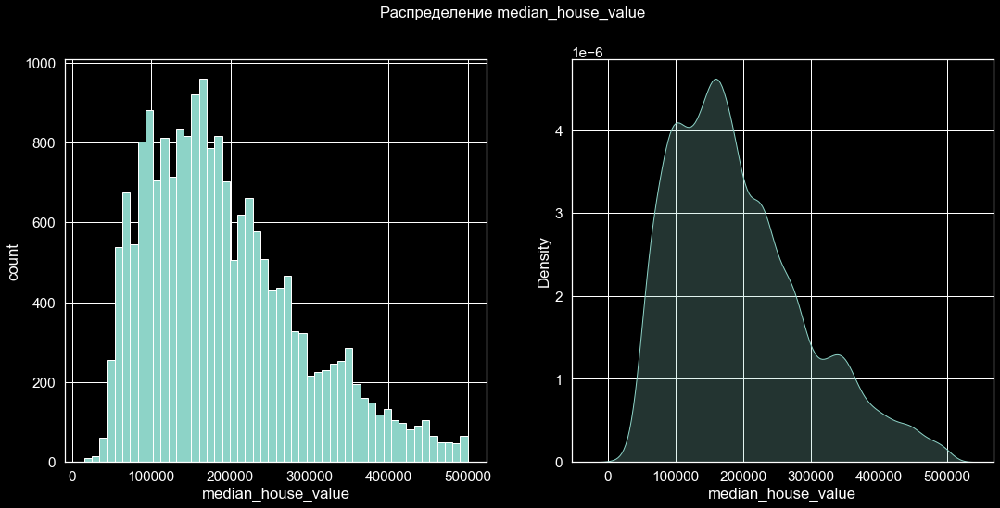

In [235]:
plt.figure(figsize = (16, 8))

plt.subplot(121)
dsh['median_house_value'].hist(density = False, bins = 50)
plt.ylabel('count')
plt.xlabel('median_house_value')

plt.subplot(122)
sns.kdeplot(dsh['median_house_value'], shade = True, legend = False)
plt.xlabel('median_house_value')

plt.suptitle('Распределение median_house_value')
plt.show()

## **Анализ признаков**

**Количественные признаки**

In [236]:
dsh.dtypes

longitude              float32
latitude               float32
housing_median_age     float32
total_rooms            float32
total_bedrooms         float32
population             float32
households             float32
median_income          float32
median_house_value     float32
<1H OCEAN                 int8
INLAND                    int8
ISLAND                    int8
NEAR BAY                  int8
NEAR OCEAN                int8
bedroom_share          float32
men_per_household      float32
population_per_room    float32
age_cat                   int8
dtype: object

In [237]:
dsh_num_features = dsh.select_dtypes(include = ['float32'])

# Целевую переменную убираем, т.к. пока смотрим закономерности самих признаков
dsh_num_features.drop('median_house_value', axis = 1, inplace = True)

In [238]:
dsh_num_features

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,bedroom_share,men_per_household,population_per_room
0,-122.230003,37.880001,41.0,880.0,129.0,322.0,126.0,8.3252,14.659091,2.555556,0.365909
1,-122.220001,37.860001,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,15.579659,2.109842,0.338217
2,-122.239998,37.849998,52.0,1467.0,190.0,496.0,177.0,7.2574,12.951602,2.802260,0.338105
3,-122.250000,37.849998,52.0,1274.0,235.0,558.0,219.0,5.6431,18.445839,2.547945,0.437991
4,-122.250000,37.849998,52.0,1627.0,280.0,565.0,259.0,3.8462,17.209589,2.181467,0.347265
...,...,...,...,...,...,...,...,...,...,...,...
20630,-121.089996,39.480000,25.0,1665.0,374.0,845.0,330.0,1.5603,22.462463,2.560606,0.507508
20631,-121.209999,39.490002,18.0,697.0,150.0,356.0,114.0,2.5568,21.520803,3.122807,0.510760
20632,-121.220001,39.430000,17.0,2254.0,485.0,1220.0,433.0,1.7000,21.517303,2.817552,0.541260
20633,-121.320000,39.430000,18.0,1860.0,409.0,741.0,349.0,1.8672,21.989246,2.123209,0.398387


array([[<AxesSubplot:title={'center':'longitude'}>,
        <AxesSubplot:title={'center':'latitude'}>,
        <AxesSubplot:title={'center':'housing_median_age'}>],
       [<AxesSubplot:title={'center':'total_rooms'}>,
        <AxesSubplot:title={'center':'total_bedrooms'}>,
        <AxesSubplot:title={'center':'population'}>],
       [<AxesSubplot:title={'center':'households'}>,
        <AxesSubplot:title={'center':'median_income'}>,
        <AxesSubplot:title={'center':'bedroom_share'}>],
       [<AxesSubplot:title={'center':'men_per_household'}>,
        <AxesSubplot:title={'center':'population_per_room'}>,
        <AxesSubplot:>]], dtype=object)

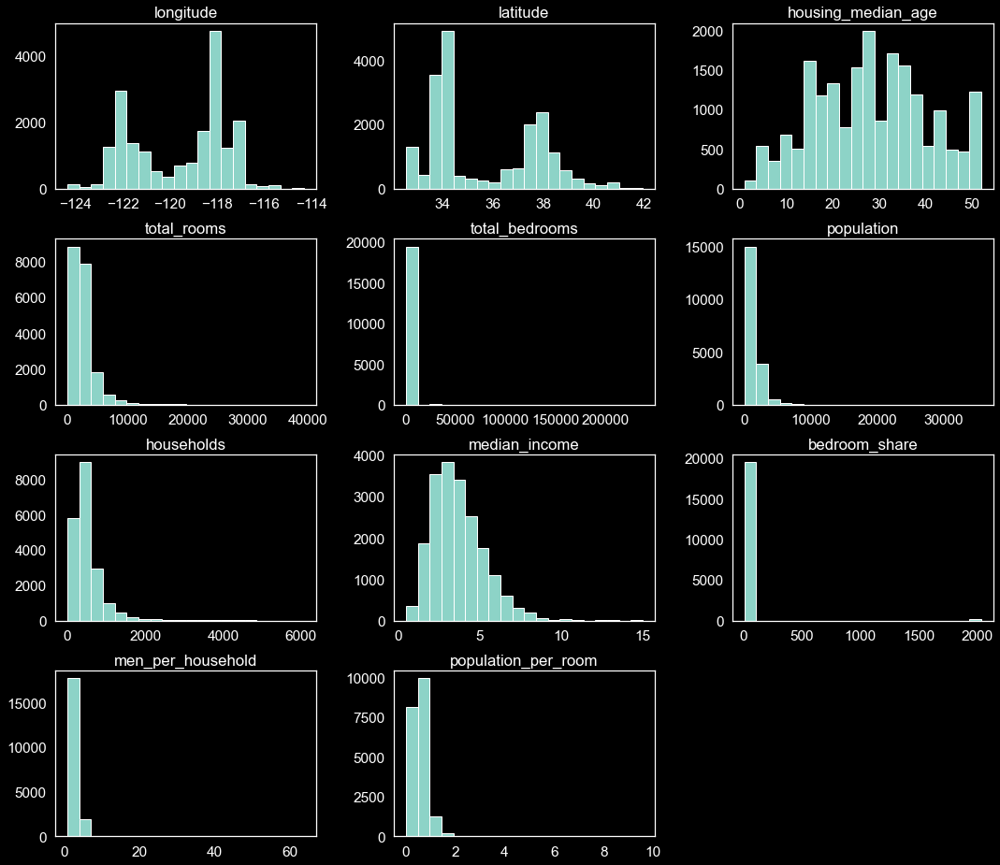

In [239]:
dsh_num_features.hist(figsize = (16,16), bins = 20, grid = False)

Рассмотрим подробнее отдельные гистограммы.

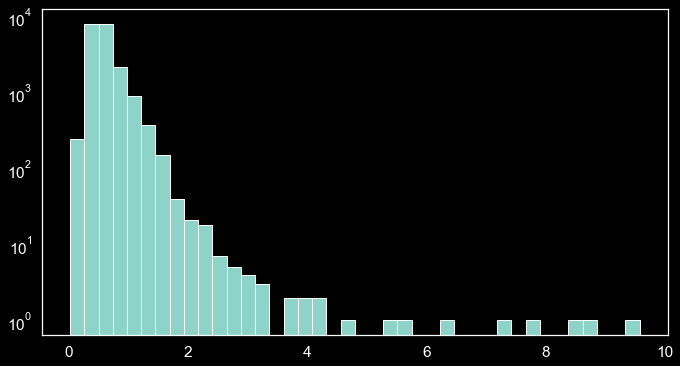

In [240]:
dsh_num_features['population_per_room'].hist(figsize = (10,6), bins = 40, grid = False)
plt.yscale('log')

Можно считать значения признака population_per_room больше 3.5 выбросом и удалить их.

In [241]:
dsh = dsh.loc[dsh['population_per_room'] < 3.5]

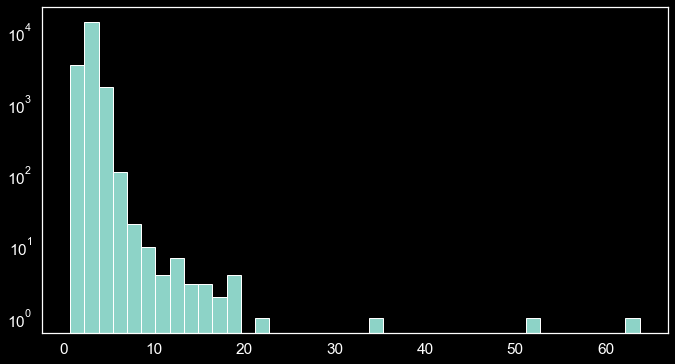

In [242]:
dsh_num_features['men_per_household'].hist(figsize = (10,6), bins = 40, grid = False)
plt.yscale('log')

Можно считать значения признака men_per_household больше 10 выбросом и удалить их.

In [243]:
dsh = dsh.loc[dsh['men_per_household'] < 10]

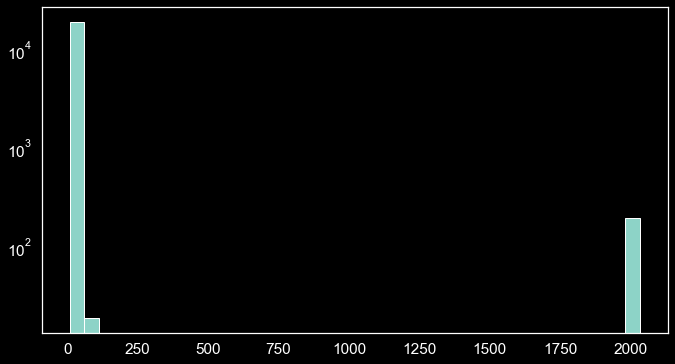

In [244]:
dsh_num_features['bedroom_share'].hist(figsize = (10,6), bins = 40, grid = False)
plt.yscale('log')

Промежуточный анализ:
1. Удалив выбросы признаков "population_per_room" и "men_per_household" мы автоматически удалили выбросы по признаку "population", либо по признакам "total_rooms" и "households" соответственно.
2. "Выброс" по признаку "bedroom_share" я не считаю выбросом, т.к. не исключаю наличия квартир без спален, тем более, что признаки "population_per_room" и "men_per_household" у таких объектов не выбиваются из соответствующего ряда.


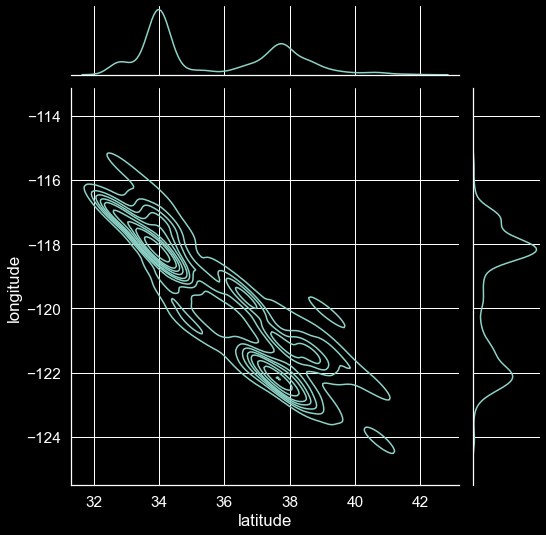

In [245]:
grid = sns.jointplot(dsh_num_features['latitude'], dsh_num_features['longitude'], kind = 'kde')
grid.fig.set_figwidth(8)
grid.fig.set_figheight(8)

plt.show()

Визуально видно, как город географически разделён на 2 части, поэтому их имеет смысл рассматривать раздельно.

Для этого добавим новый признак "city".

In [246]:
dsh['city'] = ((dsh['longitude'] < -120.5) * 1).astype('int8')

In [247]:
dsh.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,bedroom_share,men_per_household,population_per_room,age_cat,city
0,-122.230003,37.880001,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,14.659091,2.555556,0.365909,4,1
1,-122.220001,37.860001,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,15.579659,2.109842,0.338217,3,1
2,-122.239998,37.849998,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,12.951602,2.802260,0.338105,4,1
3,-122.250000,37.849998,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0,18.445839,2.547945,0.437991,4,1
4,-122.250000,37.849998,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0,17.209589,2.181467,0.347265,4,1


In [248]:
dsh.dtypes

longitude              float32
latitude               float32
housing_median_age     float32
total_rooms            float32
total_bedrooms         float32
population             float32
households             float32
median_income          float32
median_house_value     float32
<1H OCEAN                 int8
INLAND                    int8
ISLAND                    int8
NEAR BAY                  int8
NEAR OCEAN                int8
bedroom_share          float32
men_per_household      float32
population_per_room    float32
age_cat                   int8
city                      int8
dtype: object

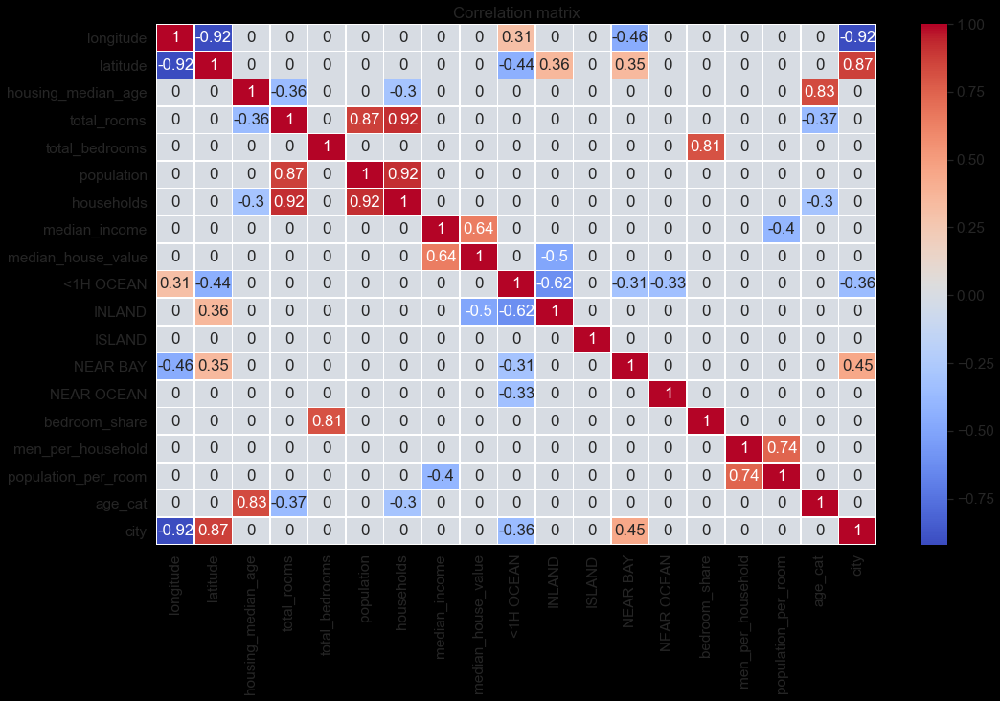

In [249]:
# Построим матрицу корреляций

plt.figure(figsize = (15,10))
#plt.style.use('dark_background')
plt.style.use('fivethirtyeight')

sns.set(font_scale = 1.4)

corr_matrix = dsh.corr()
corr_matrix = np.round(corr_matrix, 2)
corr_matrix[np.abs(corr_matrix) < 0.3] = 0

sns.heatmap(corr_matrix, annot = True, linewidths = .5, cmap = 'coolwarm')

plt.title('Correlation matrix')
plt.show()

К сожалению, какой-то важной информации из матрицы корреляций мы почерпунть не сможем:
1. Корреляция широты и долготы - скорее случайна и, думаю, зависит от расположения побережья (которое тянется с северо-запада на юго-восток).
2. Корреляция между количеством комнат и числом жителей c количеством домохозяйств очевидна: больше народу - нужно больше пространства для проживания.
3. Слабая корреляция между доходом и стоимостью дома также очевидна: больше доход - дороже дом.
4. Корреляция между признаками "men_per_household" и "population_per_room" объясняется тем, что в их расчёте используется один и тот же признак "population".

## **Гео данные**

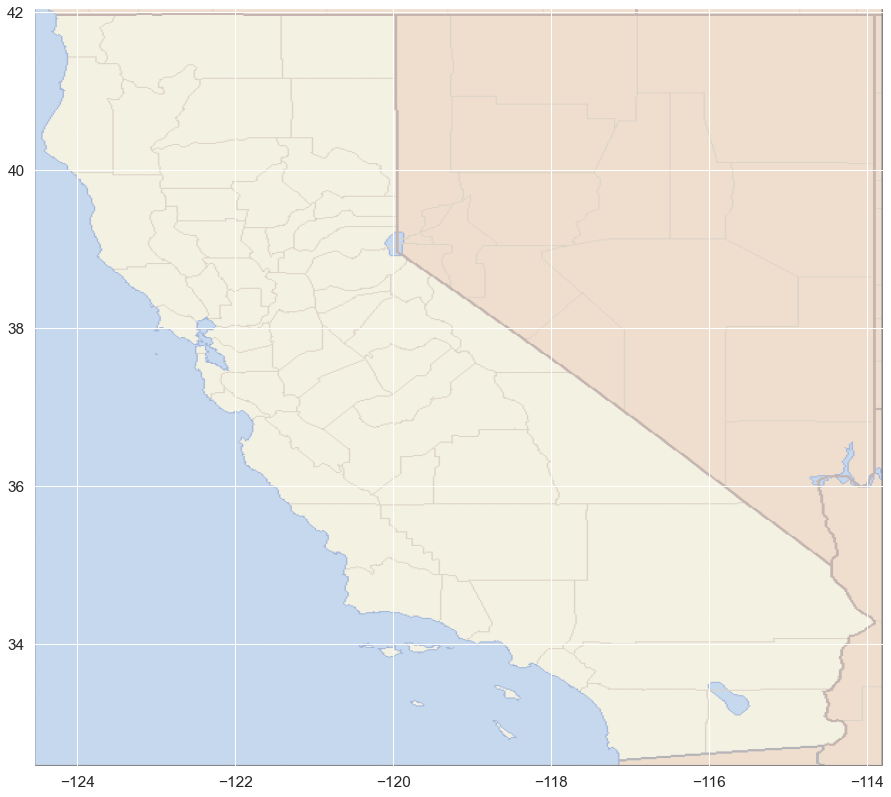

In [250]:
california_map = img.imread(CALIFORNIA_MAP_PATH)

plt.figure(figsize=(20,13))
plt.imshow(california_map, extent=[-124.55, -113.80, 32.45, 42.05], alpha=0.5)
plt.show()

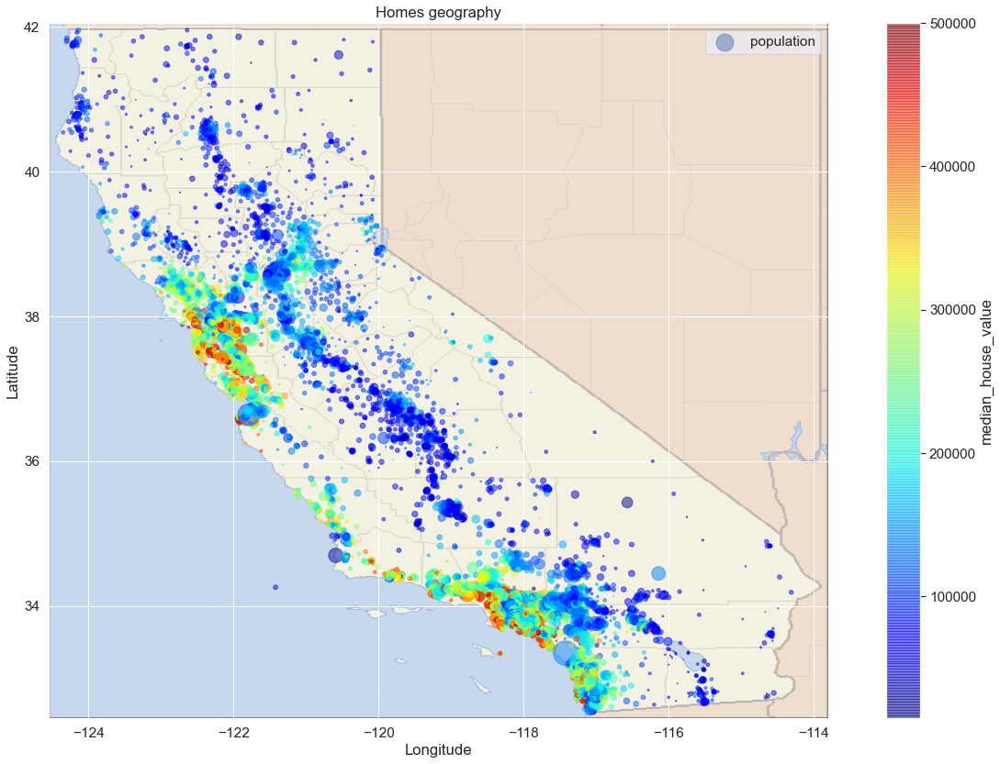

In [251]:
dsh.plot(kind = 'scatter', x = 'longitude', y = 'latitude', alpha = 0.5,
        s = dsh['population'] / 50, label = 'population', c = 'median_house_value',
        cmap = plt.get_cmap('jet'), figsize = (20,13))

plt.imshow(california_map, extent = [-124.55, -113.80, 32.45, 42.05], alpha = 0.5)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Homes geography")
plt.legend()
plt.show()

In [252]:
dsh

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,bedroom_share,men_per_household,population_per_room,age_cat,city
0,-122.230003,37.880001,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,14.659091,2.555556,0.365909,4,1
1,-122.220001,37.860001,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,15.579659,2.109842,0.338217,3,1
2,-122.239998,37.849998,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,12.951602,2.802260,0.338105,4,1
3,-122.250000,37.849998,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0,18.445839,2.547945,0.437991,4,1
4,-122.250000,37.849998,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0,17.209589,2.181467,0.347265,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20630,-121.089996,39.480000,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,0,1,0,0,0,22.462463,2.560606,0.507508,3,1
20631,-121.209999,39.490002,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,0,1,0,0,0,21.520803,3.122807,0.510760,3,1
20632,-121.220001,39.430000,17.0,2254.0,485.0,1220.0,433.0,1.7000,92300.0,0,1,0,0,0,21.517303,2.817552,0.541260,3,1
20633,-121.320000,39.430000,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,0,1,0,0,0,21.989246,2.123209,0.398387,3,1


In [254]:
dsh.to_csv(DATASET_NEW, index = False, encoding = 'utf-8')